In [279]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [280]:
from hexgrid import HexCoord, HexGrid, build_obstacle_map, get_neighbors_at_radius, VelocityState, image_to_hex_obstacles, hexes_in_between_solid
from hexstar import HStarProblem, HStarSearch, h_cost_travel_time, construct_full_solution, HStarProblem, BidHStarSearch
from hexplot import plot_hex_grid_2, plot_velocity_profile

import matplotlib.pyplot as plt
import itertools



In [320]:
RADIUS = 15
MAP_JPG_SIZE = 1000 # largest dimension in px
a_max = 2
a_min = 8
ay_window_ms = 10

collision_radius = 0

jps_horizon = None
n_step = 1

In [321]:
obs_density = 0.15
hex_size = 1
n_obs = int(obs_density * 3 * RADIUS * (RADIUS + 1))
start = HexCoord(q=-RADIUS + 4, r=RADIUS - 4)
#start = HexCoord(0,0)
goal = HexCoord(q=RADIUS - 4, r=-RADIUS + 4)

obs = build_obstacle_map(
    center = HexCoord(0,0),
    radius = RADIUS,
    types = [("random_n", {"n": n_obs})],
    exclude=[start, goal],
    seed=42
)
obs = set(obs.keys())
from hexgrid import hexes_in_between_solid
from_hex = HexCoord(q = -RADIUS//2 + 5, r = -RADIUS // 2 + 5)
to_hex = HexCoord(q = RADIUS // 2 - 5, r = RADIUS // 2 - 5)
line = hexes_in_between_solid(from_hex, to_hex) 
obs = obs.union(line)


for i in range(5):
    obs = obs - get_neighbors_at_radius(start, i)
    obs = obs - get_neighbors_at_radius(goal, i)

obs = set()
obs = obs.union(get_neighbors_at_radius(HexCoord(0,0), RADIUS))

In [322]:
hg = HexGrid(hex_size, obs)

problem = HStarProblem(
    hg, # hex grid
    start,
    goal,
    a_max,  # maximum acceleration (for acceleration phase)
    a_min,  # maximum deceleration (positive value; used with sign as needed)
    collision_radius = collision_radius,
    jps_horizon =  jps_horizon,
    ay_window_ms = ay_window_ms,
    n_step = n_step,   
    start_v = VelocityState(0, None),
    goal_v = VelocityState(0, None)
)
#problem.goal_v=VelocityState(10, problem.DIRECTIONS.index(HexCoord(1,0))) 
problem.start_v=VelocityState(10, problem.DIRECTIONS.index(HexCoord(0,-1))) 


<Axes: title={'center': 'Hex grid (radius=15) centered at (0,0) Map'}, xlabel='x', ylabel='y'>

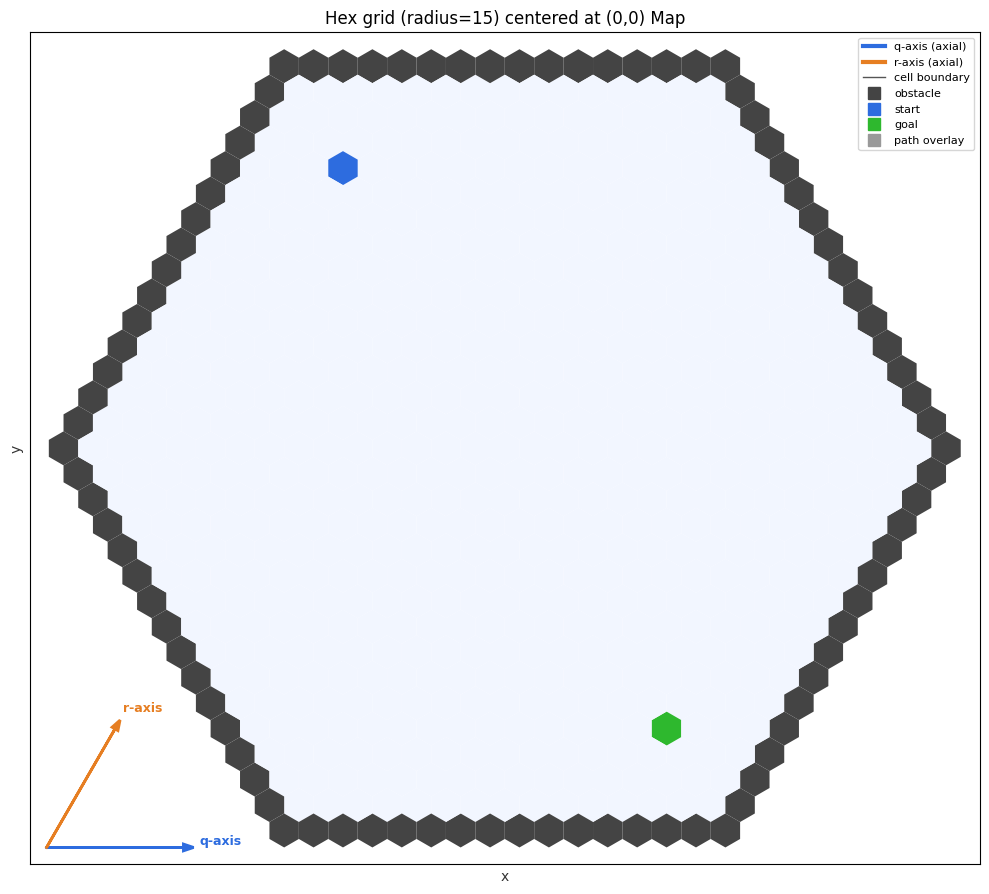

In [324]:
plot_hex_grid_2(
    hg.obstacles,#.union(problem.collision_radius_map),
    start,
    HexCoord(0,0),
    RADIUS,
    goal = goal,
    figsize=(10,10),
    show_coords = False,
    #path = hexes_in_between_solid(HexCoord(q=0, r=0), HexCoord(q=14, r=10)),
    #path=problem.get_available_hexes_in_dir(start, problem.DIRECTIONS[0], ray_range = 50),
    #path=problem.actions(hs.root),
    #path=set(unique_direction_vectors_up_to_n(HexCoord(0,0), RADIUS)),
    facecolor_path = "#999999",
    #path = set([n.location for n in fsolution[-24:-21]]),
    #path = fsolution,
    linewidth=0,
    plt_title = f"Map",
    save_path=f"map-2",
)

In [325]:
hs = HStarSearch(
    problem = problem,
    heuristic = h_cost_travel_time
)

fsolution = hs.search()
fsolution_path = construct_full_solution(fsolution)
benchmarks = hs.get_benchmarks()
print(f'Search time: {benchmarks["search_time"]}s')
print(f'Solution cost: {benchmarks["solution_cost"]}')

Search time: 0.016069889068603516s
Solution cost: 7.6210235533030595


In [326]:
bi_s = BidHStarSearch(
    problem = problem,
    heuristic = h_cost_travel_time,
    join_tolerance =5,
    enable_benchmarking=True,
    state_key_mode="location_direction",
    progress_every=1,
    progress_top_k=3,
)

bi_solution = bi_s.search()
bi_solution_path = construct_full_solution(bi_solution)

benchmarks_bi = bi_s.get_benchmarks()
print(f'Search time: {benchmarks_bi["search_time"]}s')
print(f'Solution cost bd: {benchmarks_bi["solution_cost"]}')
print(f'Solution cost f: {benchmarks["solution_cost"]}')



[JOIN DEBUG]
expanding_forward=False
join_tolerance=5
epsilon=1e-09
----------------------------------------------------------------------------------------------------
child:
  loc=HexCoord(q=5, r=-5)
  vel=(mag=12.894839181883, dir=4 -> HexCoord(q=-1, r=1) | reverse=1 -> HexCoord(q=1, r=-1))
  g_cost=1.611854897735
  h_cost=1.474612247988
  f_cost=3.086467145723
  step_distance=10.392304845413264
  parent_loc=HexCoord(q=11, r=-11)
  parent_vel=(mag=0.000000000000, dir=None)
----------------------------------------------------------------------------------------------------
other:
  loc=HexCoord(q=5, r=-5)
  vel=(mag=14.520718015457, dir=1 -> HexCoord(q=1, r=-1) | reverse=4 -> HexCoord(q=-1, r=1))
  g_cost=2.260359007728
  h_cost=0.683513962462
  f_cost=2.94387297019
  step_distance=27.712812921102035
  parent_loc=HexCoord(q=-11, r=11)
  parent_vel=(mag=10.000000000000, dir=2 -> HexCoord(q=0, r=-1) | reverse=5 -> HexCoord(q=0, r=1))
---------------------------------------------------

<Axes: title={'center': 'Hex grid (radius=15) centered at (0,0) Solution Reverse'}, xlabel='x', ylabel='y'>

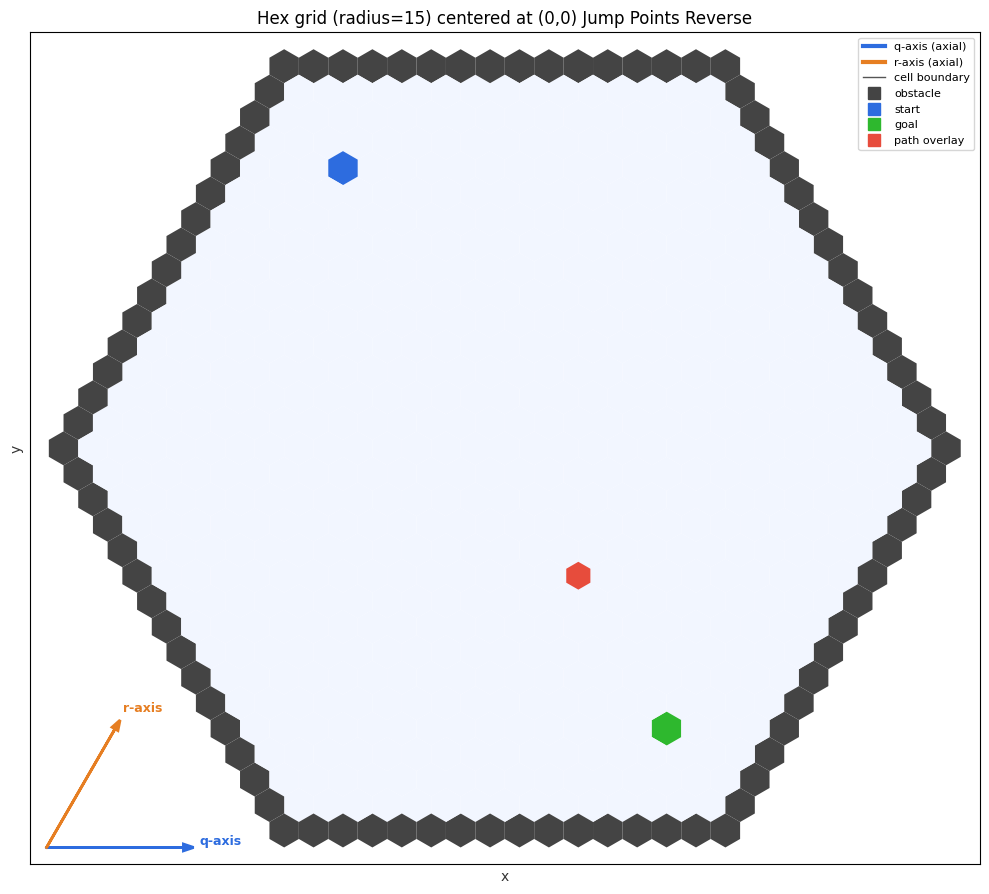

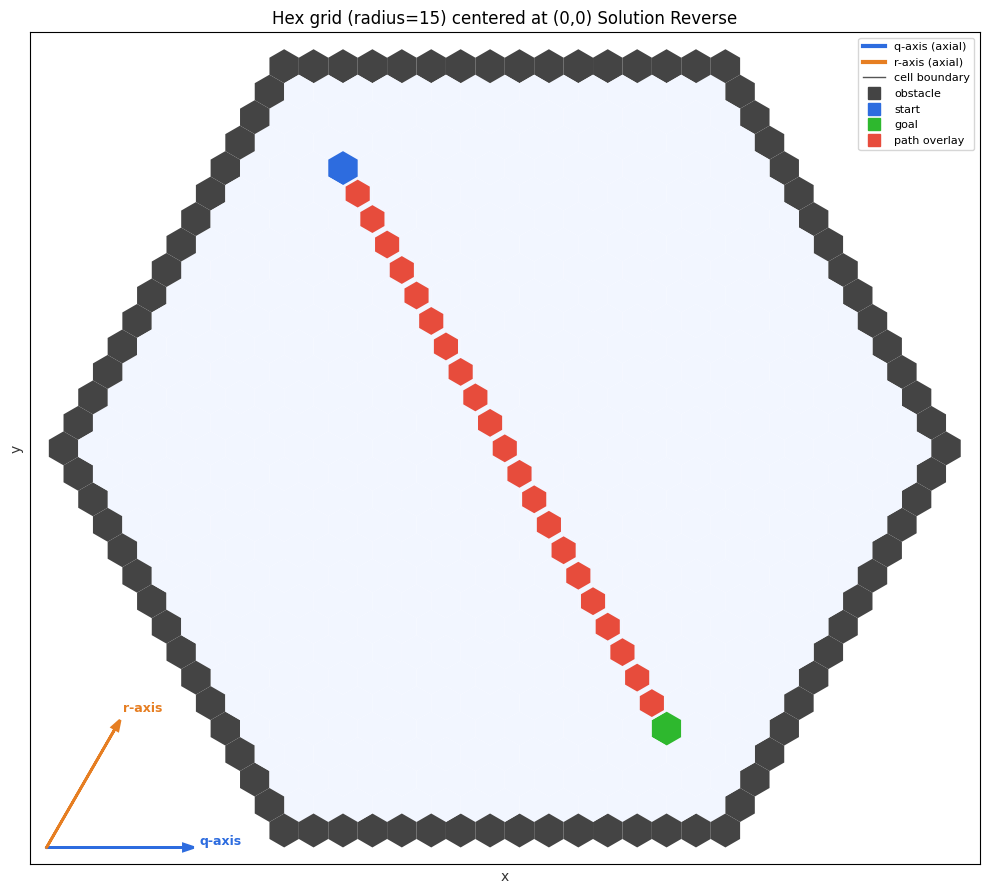

In [327]:
plot_hex_grid_2(
    obs,
    start,
    HexCoord(0,0),
    RADIUS,
    goal = goal,
    figsize=(10,10),
    show_coords = False,
    path = set([n.location for n in bi_solution]),
    linewidth=0,
    plt_title = f"Jump Points Reverse",
    save_path=f"jump-points-reverse",
)
plot_hex_grid_2(
    obs,
    start,
    HexCoord(0,0),
    RADIUS,
    goal = goal,
    figsize=(10,10),
    show_coords = False,
    path = bi_solution_path,
    linewidth=0,
    plt_title = f"Solution Reverse",
    save_path=f"solution-reverse-c",
)

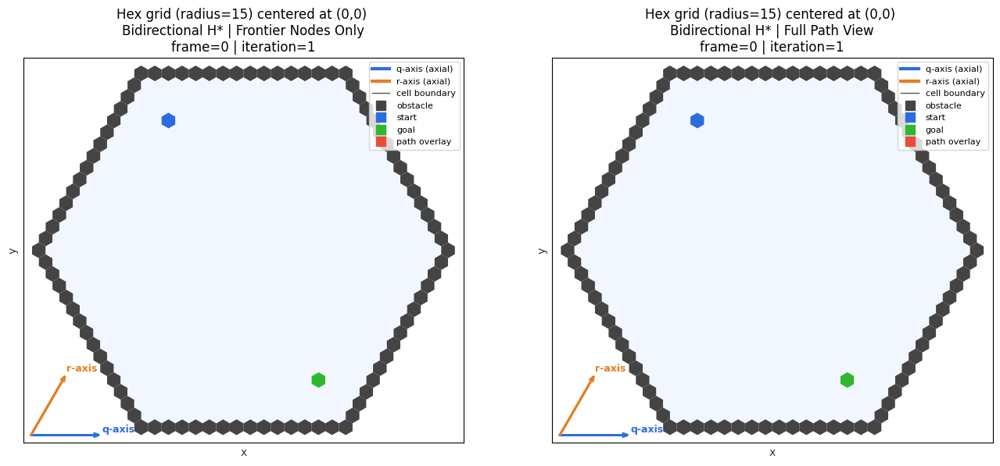

In [328]:
from hexplot import animate_progress_dual_view_with_solution
from IPython.display import HTML

anim, fig, ax = animate_progress_dual_view_with_solution(
    progress_snapshots=benchmarks_bi["progress_snapshots"],
    snapshot_with_paths_fn=bi_s.snapshot_with_paths,
    solution=bi_solution,
    obstacles=obs,
    start=start,
    center=HexCoord(0, 0),
    radius=RADIUS,
    goal=goal,
    solid_final=True,
    #solid_progress=False,
    figsize=(16, 9),
    interval=400,
    repeat=False,
    show_coords=False,
    linewidth=0,
    title_prefix="\nBidirectional H*",
    step=1,
)
HTML(anim.to_jshtml())



In [329]:
problem.DIRECTIONS[bi_solution[-1].velocity.direction]

TypeError: list indices must be integers or slices, not NoneType

In [ ]:
problem.DIRECTIONS[bi_solution[0].velocity.direction]

In [ ]:
plot_velocity_profile(fsolution)

In [ ]:
plot_velocity_profile(bi_solution)